In [34]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore')
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import f1_score, confusion_matrix, mean_squared_error, precision_score

In [35]:
data = [pd.read_csv(f'dataset-of-{decade}0s.csv') for decade in ['6', '7', '8', '9', '0', '1']]

In [36]:
for i, decade in enumerate([1960, 1970, 1980, 1990, 2000, 2010]):
    data[i]['decade'] = pd.Series(decade, index=data[i].index)

data = pd.concat(data, axis=0).sample(frac=1.0, random_state=1).reset_index(drop=True)

In [37]:
data.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
0,Attaining - Take 1 / Alternate Version,John Coltrane,spotify:track:3EwLV5hZqLKx5e0Lp1QcB7,0.342,0.462,4,-12.931,0,0.0389,0.51400,0.018100,0.0977,0.397,98.466,816867,4,24.84938,33,0,1970
1,So Fly,NB Ridaz Featuring Gemini,spotify:track:2BjIi07kN0yKSur0Fwrnss,0.861,0.519,2,-6.404,1,0.1120,0.13600,0.000000,0.1230,0.519,81.966,254533,4,50.03590,11,1,2000
2,Because I Got It Like That,Jungle Brothers,spotify:track:5unLExF3iiG3YkU11u6wFO,0.900,0.916,1,-7.481,0,0.1150,0.22000,0.000141,0.0323,0.538,102.916,277894,4,24.71271,16,0,1980
3,Babylon a Fall - Remastered,Yabby You,spotify:track:6xfe0G2HwRDQaChxkzvNKw,0.714,0.301,2,-14.800,1,0.1230,0.15600,0.661000,0.2290,0.651,74.856,357671,4,104.64231,11,0,1970
4,Fins,Jimmy Buffett,spotify:track:4h0gZ422QxBRdTV14u0P8y,0.661,0.645,4,-13.520,1,0.0487,0.00895,0.000000,0.0362,0.930,136.693,204640,4,31.99617,10,1,1970


In [38]:
data.shape

(41106, 20)

In [39]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41106 entries, 0 to 41105
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   uri               41106 non-null  object 
 3   danceability      41106 non-null  float64
 4   energy            41106 non-null  float64
 5   key               41106 non-null  int64  
 6   loudness          41106 non-null  float64
 7   mode              41106 non-null  int64  
 8   speechiness       41106 non-null  float64
 9   acousticness      41106 non-null  float64
 10  instrumentalness  41106 non-null  float64
 11  liveness          41106 non-null  float64
 12  valence           41106 non-null  float64
 13  tempo             41106 non-null  float64
 14  duration_ms       41106 non-null  int64  
 15  time_signature    41106 non-null  int64  
 16  chorus_hit        41106 non-null  float6

In [40]:
print(data['target'].value_counts())

0    20553
1    20553
Name: target, dtype: int64


In [41]:
# calculate the proportion of target values that are 1
prop_1 = data[data['target'] == 1].shape[0] / data.shape[0]
print("Proportion of target values that are 1:", prop_1)

Proportion of target values that are 1: 0.5


In [42]:
#droping null values
data = data.dropna() 
pd.isnull(data).sum() #Check Any Null Value

track               0
artist              0
uri                 0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
chorus_hit          0
sections            0
target              0
decade              0
dtype: int64

In [43]:
data.columns

Index(['track', 'artist', 'uri', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms', 'time_signature', 'chorus_hit',
       'sections', 'target', 'decade'],
      dtype='object')

In [44]:
#droping the columns not needed in the model
data = data.drop(columns=["track", "artist", "uri", "sections"])
data.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'time_signature', 'chorus_hit', 'target', 'decade'],
      dtype='object')

In [45]:
data.to_csv('updated_dataset.csv', index=False)

## Data 

Dataset is spanned around six decades starting from 1960's to 2010's. This collected data is in 6 different CSV files, to work on this data, we needed to merge all the six files. Once data is merged, data cleaning process has started.

- To make data clean and reliable, null values in the data are dropped using data.dropna() function which helps in droping null values.

- the collected data contains many columns. within this columns there are very useful columns and some of them are not very helpful. To drop these columns, data.drop(columns=[' ',' ',.....]) function is used which helps in droping the columns we gave as parameters.

github link for cleaned data: https://github.com/uic-ds-fall-2023/class-project-pentagon/blob/main/updated_dataset.csv


# EDA

 **Univariate Analysis of every column**

In [46]:
print(data['target'].value_counts())

0    20553
1    20553
Name: target, dtype: int64


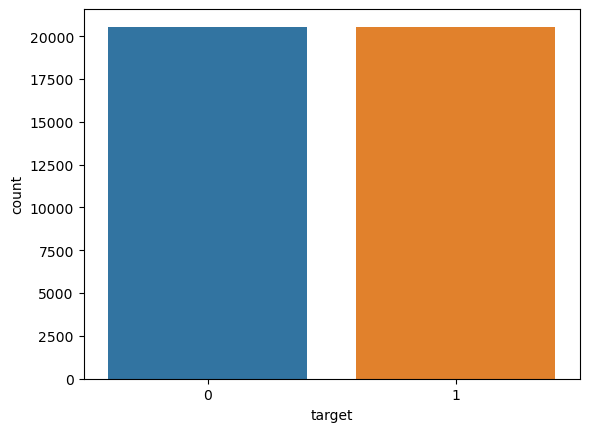

In [47]:
# Plot the distribution of the target variable
sns.countplot(x='target', data=data)
plt.show()

In [48]:
# calculate the mean of other columns for observations where target is 1
print(data.loc[data['target'] == 1].mean())

danceability             0.601237
energy                   0.624296
key                      5.248528
loudness                -8.702237
mode                     0.730064
speechiness              0.069444
acousticness             0.280814
instrumentalness         0.030687
liveness                 0.192637
valence                  0.609578
tempo                  120.288280
duration_ms         226095.539970
time_signature           3.938063
chorus_hit              39.224034
target                   1.000000
decade                1982.775264
dtype: float64


In [49]:
# calculate the mean of other columns for observations where target is 0
print(data.loc[data['target'] == 0].mean())

danceability             0.478153
energy                   0.534794
key                      5.178660
loudness               -11.740813
mode                     0.656644
speechiness              0.076477
acousticness             0.447581
instrumentalness         0.278145
liveness                 0.210432
valence                  0.475302
tempo                  118.388219
duration_ms         243659.560940
time_signature           3.849316
chorus_hit              40.988048
target                   0.000000
decade                1982.775264
dtype: float64


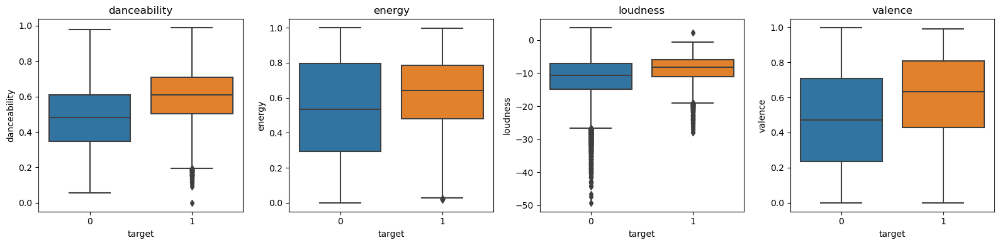

In [50]:
columns_to_compare = ['danceability', 'energy', 'loudness', 'valence']
fig, axes = plt.subplots(nrows=1, ncols=len(columns_to_compare), figsize=(16, 4))
for i, column in enumerate(columns_to_compare):
    sns.boxplot(x='target', y=column, data=data, ax=axes[i])
    axes[i].set_title(column)
plt.tight_layout()
plt.show()

In [51]:
# get summary statistics of the danceability column
print(data['danceability'].describe())

count    41106.000000
mean         0.539695
std          0.177821
min          0.000000
25%          0.420000
50%          0.552000
75%          0.669000
max          0.988000
Name: danceability, dtype: float64


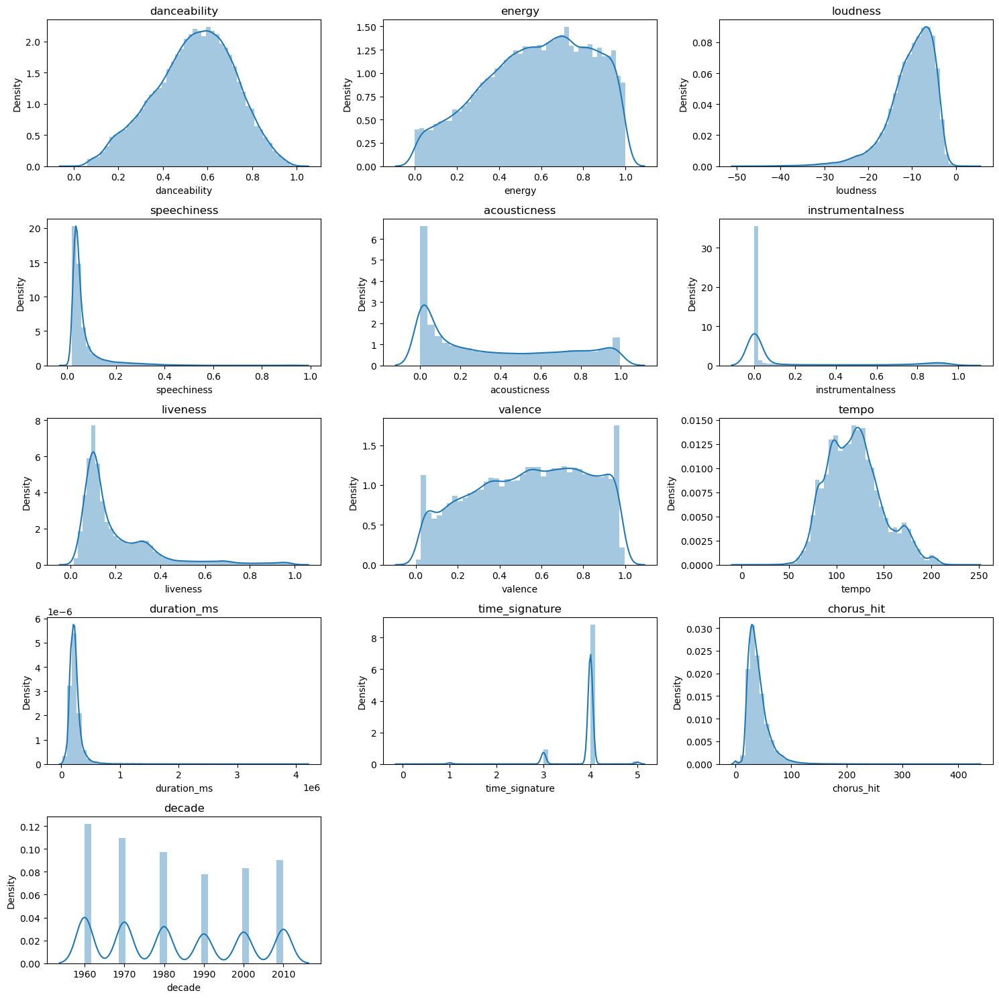

In [52]:
variable_s = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'time_signature', 'chorus_hit', 'decade']

# Set up the grid plot
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot the distribution for each variable
for i, column in enumerate(variable_s):  
    sns.distplot(data[column], ax=axes[i])
    axes[i].set_title(column)

# Hide empty subplots if the number of variables is less than 12
for j in range(i+1, len(axes)):
    axes[j].axis('off')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

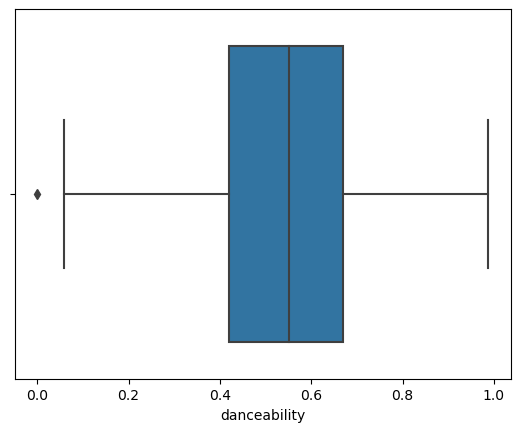

In [53]:
# check for outliers in the danceability column
sns.boxplot(x=data['danceability'])
plt.show()

In [54]:
# get summary statistics of the energy column
print(data['energy'].describe())

count    41106.000000
mean         0.579545
std          0.252628
min          0.000251
25%          0.396000
50%          0.601000
75%          0.787000
max          1.000000
Name: energy, dtype: float64


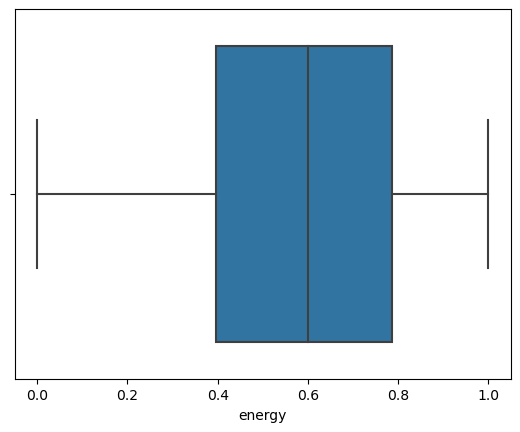

In [55]:
# check for outliers in the energy column
sns.boxplot(x=data['energy'])
plt.show()

**Bivariate Analysis**

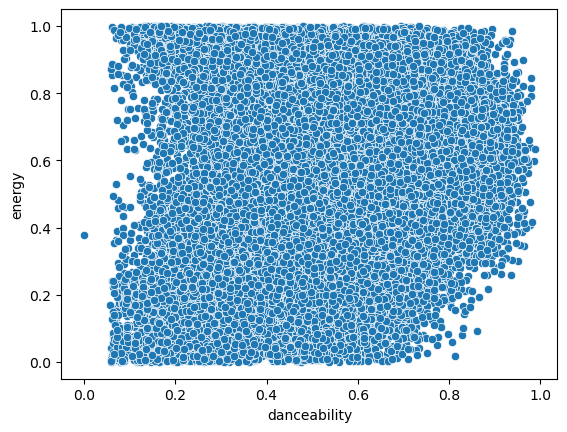

In [56]:
# create a scatter plot of danceability vs energy
sns.scatterplot(x='danceability', y='energy', data=data)
plt.show()


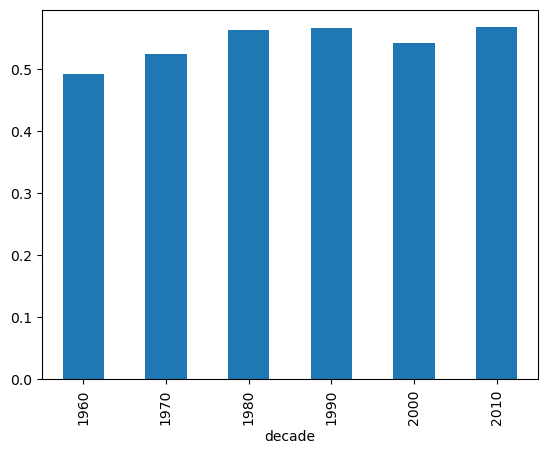

In [57]:
# create a bar plot of the average danceability by decade
data.groupby('decade')['danceability'].mean().plot(kind='bar')
plt.show()

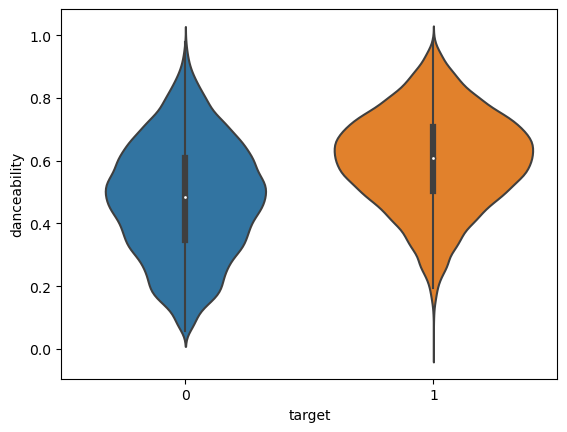

In [58]:
# create a violin plot of danceability by target
sns.violinplot(x='target', y='danceability', data=data)
plt.show()

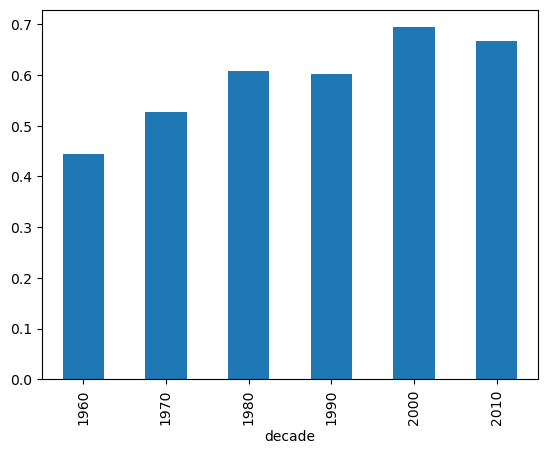

In [59]:
# create a bar plot of the average energy by decade
data.groupby('decade')['energy'].mean().plot(kind='bar')
plt.show()

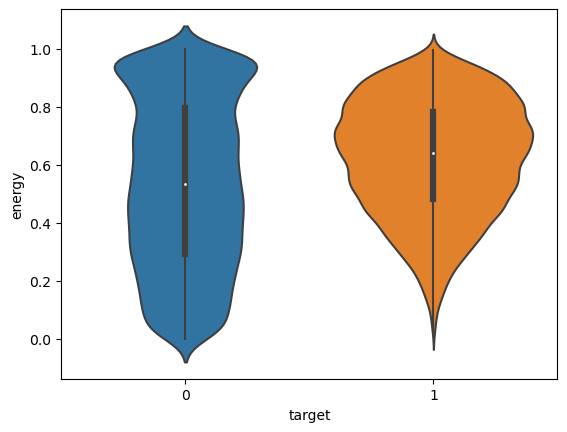

In [60]:
# create a violin plot of energy by target
sns.violinplot(x='target', y='energy', data=data)
plt.show()


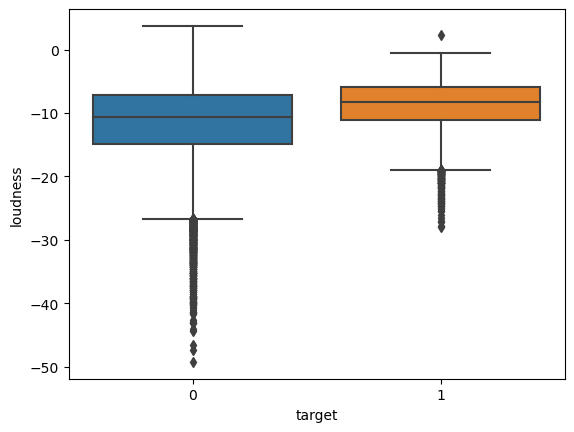

In [61]:
# Create a box plot for the relationship between loudness and target
sns.boxplot(x='target', y='loudness', data=data)
plt.show()


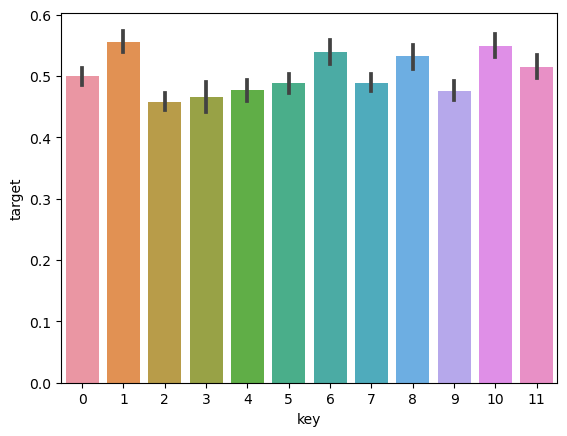

In [62]:
# Create a bar plot for the relationship between key and target
sns.barplot(x='key', y='target', data=data)
plt.show()

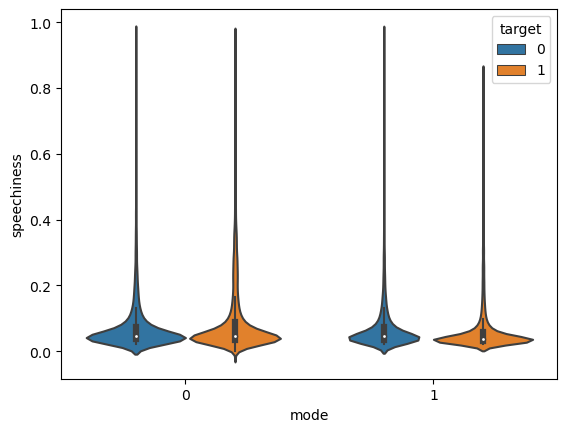

In [63]:
# Create a violin plot for the relationship between mode and speechiness
sns.violinplot(x='mode', y='speechiness', hue='target', data=data)
plt.show()

In [64]:
data = [pd.read_csv(f'dataset-of-{decade}0s.csv') for decade in ['6', '7', '8', '9', '0', '1']]
for i, decade in enumerate([1960, 1970, 1980, 1990, 2000, 2010]):
    data[i]['decade'] = pd.Series(decade, index=data[i].index)
data = pd.concat(data, axis=0).sample(frac=1.0, random_state=1).reset_index(drop=True)

#What is the average danceability of songs that were hits?
hit_danceability = data[data['target'] == 1]['danceability'].mean()
print("The average danceability of songs that were hits: ", hit_danceability)

#What is the average energy of songs that were not hits?
not_hit_energy = data[data['target'] == 0]['energy'].mean()
print("The average energy of songs that were not hits: ", not_hit_energy)

#What is the average speechiness of songs from the 2000s?
speechiness_2000s = data[data['decade'] == 2000]['speechiness'].mean()
print("The average speechiness of songs from the 2000s: ", speechiness_2000s)

#What is the average tempo of songs that were hits?
hit_tempo = data[data['target'] == 1]['tempo'].mean()
print("The average tempo of songs that were hits: ", hit_tempo)

#What is the median loudness of songs that were not hits?
not_hit_loudness = data[data['target'] == 0]['loudness'].median()
print("The median loudness of songs that were not hits: ", not_hit_loudness)

The average danceability of songs that were hits:  0.6012373765387048
The average energy of songs that were not hits:  0.5347942697416436
The average speechiness of songs from the 2000s:  0.09235953678474114
The average tempo of songs that were hits:  120.28827971585658
The median loudness of songs that were not hits:  -10.664


### EDA 
Key Insights
- The mean values of musical features differ when segmented by the target variable, indicating that these features could be good predictors in a classification task.

- The balanced nature of the target variable suggests that accuracy can be a reliable metric for model evaluation.

- The presence of outliers and the variation of features across decades suggest that data normalization and temporal features could be important for modeling.

Recommendations for Predictive Modeling
- Considering outlier treatment, especially for features like loudness and energy. Feature engineering to capture temporal trends could enhance model performance. Given the balanced data, use standard classification algorithms as a starting point.

The EDA reveals that the dataset is well-prepared for modeling, with balanced classes and no missing values. Key musical features show promising variability and correlation with the target variable, suggesting they will be useful in predictive modeling. The dataset is suitable for building a classification model to predict the target variable, potentially to identify hit songs or other outcomes of interest.

# Visualizations

The year with the highest number of hits:  1960


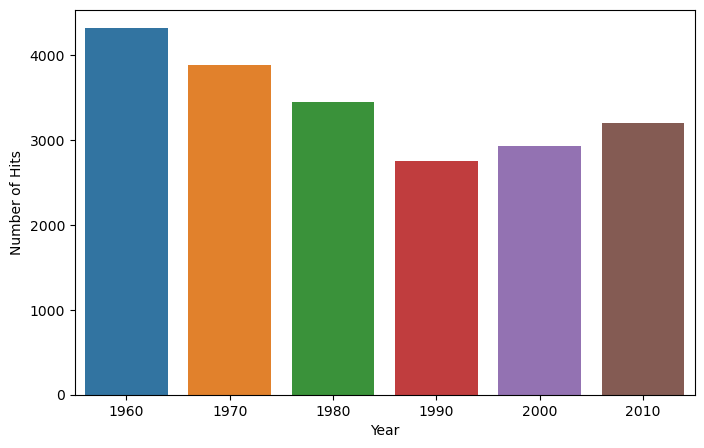

In [65]:
#Year with More No. of hits
data['year'] = data['decade'] + (data['decade'] % 10)
data['hit'] = data['target'].apply(lambda x: 1 if x == 1 else 0)
yearly_hits = data.groupby('year')['hit'].sum()
year_with_highest_hits = yearly_hits.idxmax()
print("The year with the highest number of hits: ", year_with_highest_hits)
plt.figure(figsize=(8, 5))
sns.barplot(x=yearly_hits.index, y=yearly_hits.values)
plt.xlabel("Year")
plt.ylabel("Number of Hits")
plt.show()

**top 3 difference between popular song and non-popular song by audio features?**

danceability             0.601237
energy                   0.624296
key                      5.248528
loudness                -8.702237
mode                     0.730064
speechiness              0.069444
acousticness             0.280814
instrumentalness         0.030687
liveness                 0.192637
valence                  0.609578
tempo                  120.288280
duration_ms         226095.539970
time_signature           3.938063
chorus_hit              39.224034
sections                10.183380
target                   1.000000
decade                1982.775264
year                  1982.775264
hit                      1.000000
dtype: float64
danceability             0.478153
energy                   0.534794
key                      5.178660
loudness               -11.740813
mode                     0.656644
speechiness              0.076477
acousticness             0.447581
instrumentalness         0.278145
liveness                 0.210432
valence                  0.475302

<AxesSubplot: title={'center': 'The Top Difference Between Popular Song and Non-Popular Song by Audio Features'}>

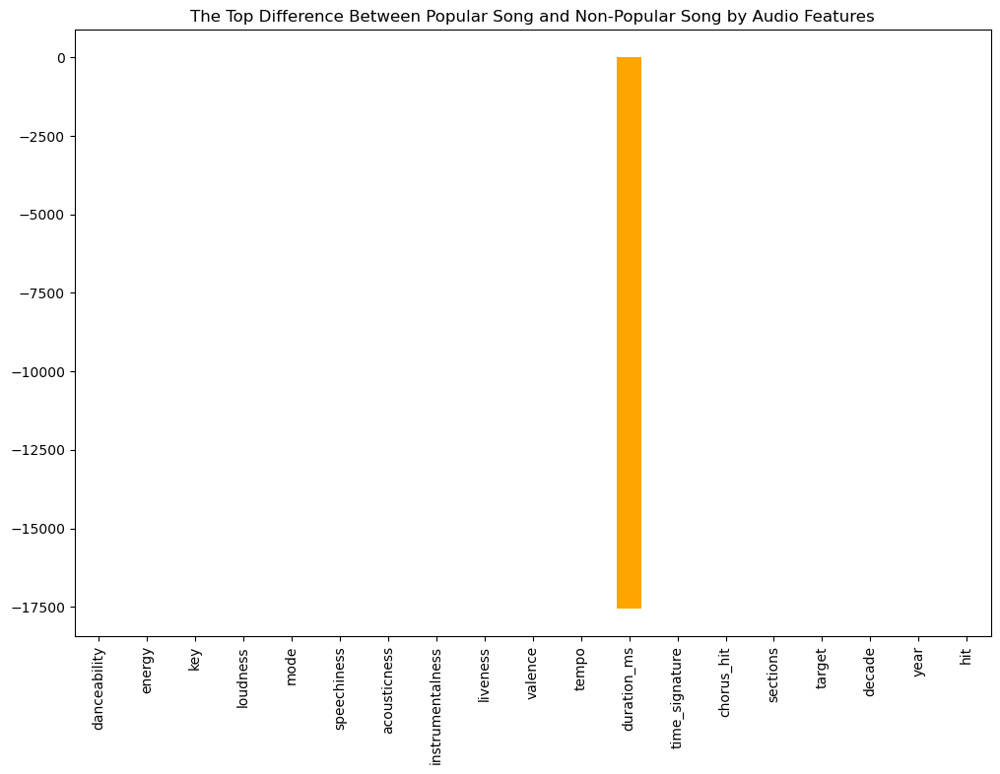

In [66]:
df4 = data[data['target'] == 1]

# Calculate and print the mean value of audio feature for popular song
print(df4.mean())

# Filter the audio features data by non-popular song 

df5 = data[data['target'] == 0]

# Calculate and print the mean value of audio feature for non-popular song
print(df5.mean())

# Show the value difference between popular songs and non popular songs by printing
print(df4.mean()-df5.mean())

# Plot the bar graph
df6 = df4.mean()-df5.mean()

df6.plot(
  kind = 'bar',
  title = 'The Top Difference Between Popular Song and Non-Popular Song by Audio Features',
  figsize = [12,8],
  color = 'orange'
  )

**top 5 artists with the highest number of hit songs in the dataset**

The top 5 artists with the highest number of hits: 
 artist
The Beatles           59
Elton John            56
The Rolling Stones    54
Stevie Wonder         53
Madonna               53
Name: hit, dtype: int64


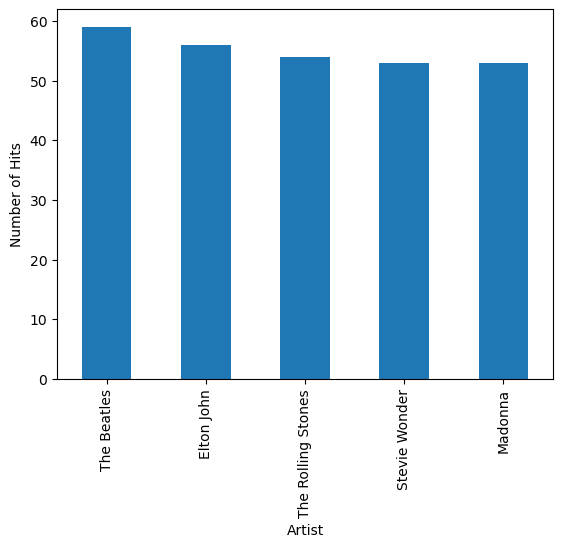

In [67]:
data['hit'] = data['target'].apply(lambda x: 1 if x == 1 else 0)
artist_hits = data.groupby('artist')['hit'].sum().sort_values(ascending=False)

top_5_artists = artist_hits.head(5)
print("The top 5 artists with the highest number of hits: \n", top_5_artists)

# Plot the number of hits per artist
top_5_artists.plot(kind='bar')
plt.xlabel("Artist")
plt.ylabel("Number of Hits")
plt.show()

**What are the top 4 keys with the highest liveness?**

In [68]:
top_4_keys_liveness = data.sort_values(by='liveness',
ascending=False).groupby('key').mean().sort_values(by='liveness', ascending=False).head(4)
print("The top 4 keys with the highest liveness: \n", top_4_keys_liveness)

The top 4 keys with the highest liveness: 
      danceability    energy   loudness      mode  speechiness  acousticness  \
key                                                                           
4        0.522066  0.586986 -10.147801  0.554017     0.066214      0.358393   
7        0.539817  0.571788 -10.400520  0.804111     0.069582      0.372331   
11       0.560496  0.629182  -9.574045  0.460391     0.083116      0.283540   
6        0.556014  0.626970  -9.337614  0.557059     0.087804      0.290990   

     instrumentalness  liveness   valence       tempo    duration_ms  \
key                                                                    
4            0.145684  0.216126  0.532034  119.771573  233835.265423   
7            0.151022  0.208603  0.551720  118.734045  231149.281137   
11           0.147583  0.206594  0.547247  120.111876  240285.809947   
6            0.133232  0.202778  0.542199  119.035699  239758.919260   

     time_signature  chorus_hit   sections    ta

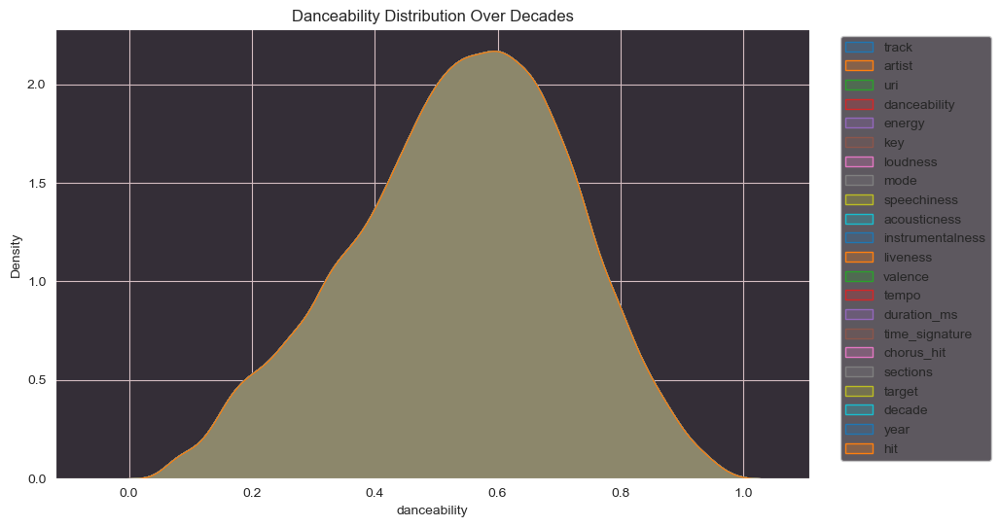

In [69]:
#Danceability Distribution Over Decades

import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the Pitaya Smoothie inspired theme for the plot
sns.set_style("darkgrid", {
    "axes.facecolor": "#342E37",
    "grid.color": "#D3BCC0",
})

# Danceability Distribution
plt.figure(figsize=(10, 6))
for decade, dataset in data.items():
    sns.kdeplot(data=data, x='danceability', shade=True, label=decade)
plt.title('Danceability Distribution Over Decades')
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show();

### Visualization - 1

Investigating energy distribution across decades offers valuable insights due to technological advancements altering efficiency and nature of energy use. Political, economic, and environmental policy shifts, coupled with societal attitudes, significantly influence energy consumption patterns. This analysis aids in understanding the environmental impact of human activities, particularly regarding climate change and resource depletion. Energy consumption patterns, reflecting economic development, vary across decades, correlating with global and regional economic trends. Such historical analysis is crucial for predictive analysis, forecasting future energy needs, and shaping energy policies, thereby fostering discussions on sustainable energy practices and policies.

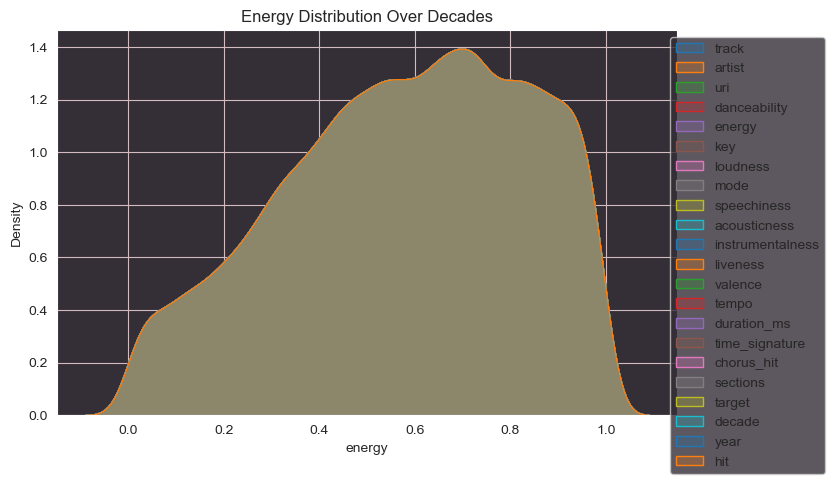

In [70]:
#Energy Distribution Over Decades
plt.figure(figsize=(8, 5))
for decade, dataset in data.items():
    sns.kdeplot(data=data, x='energy', shade=True, label=decade)
plt.title('Energy Distribution Over Decades')
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

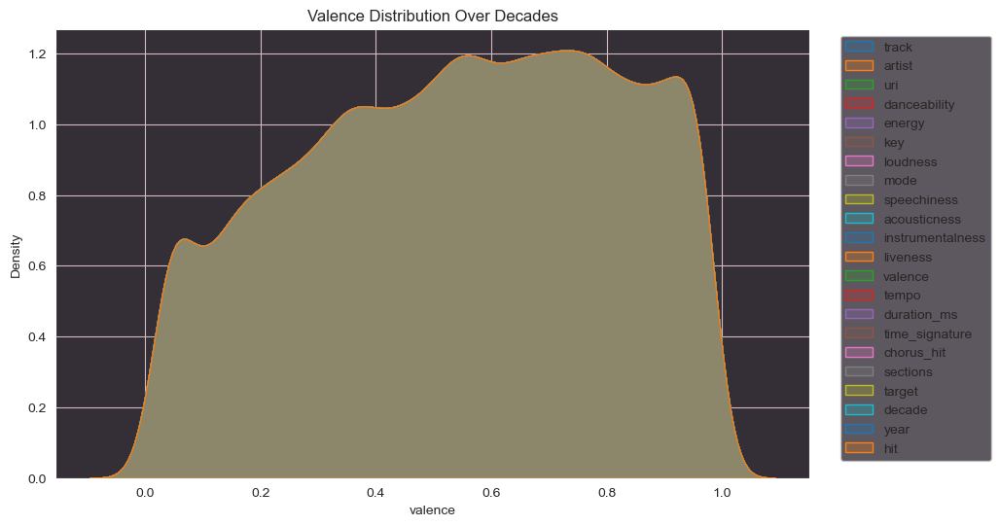

In [71]:
# Valence Distribution over decades
plt.figure(figsize=(10, 6))
for decade, dataset in data.items():
    sns.kdeplot(data=data, x='valence', shade=True, label=decade)
plt.title('Valence Distribution Over Decades')
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()


<Figure size 1200x800 with 0 Axes>

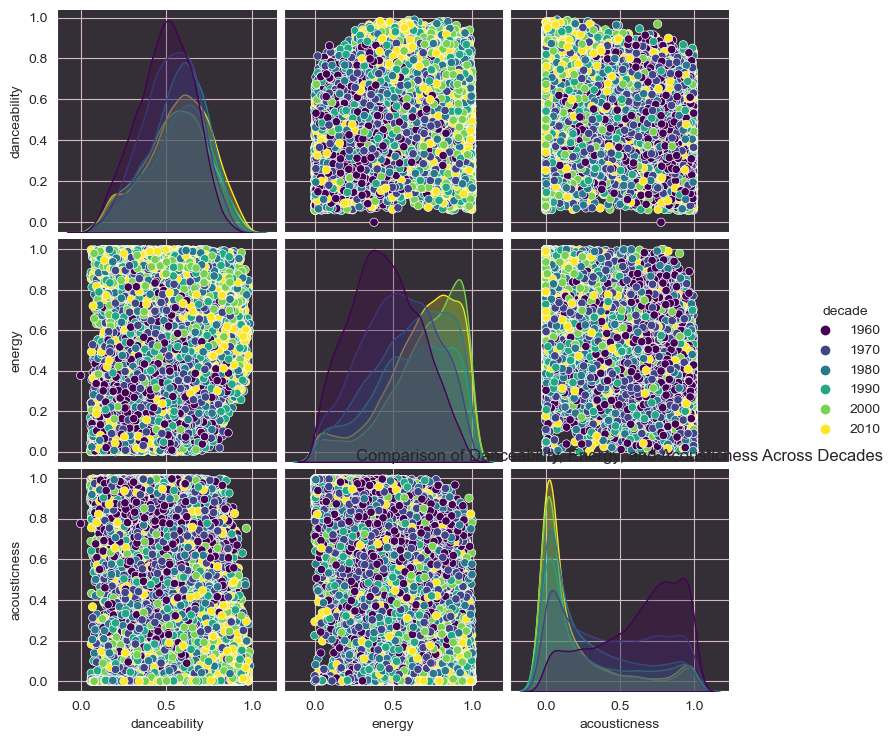

In [72]:
factors = ['danceability', 'energy', 'acousticness']

# Create a pairplot to visualize the relationships between these factors across different decades
plt.figure(figsize=(12, 8))
sns.pairplot(data, vars=factors, hue='decade', palette='viridis')
plt.title("Comparison of Danceability, Energy, and Acousticness Across Decades")
plt.show()

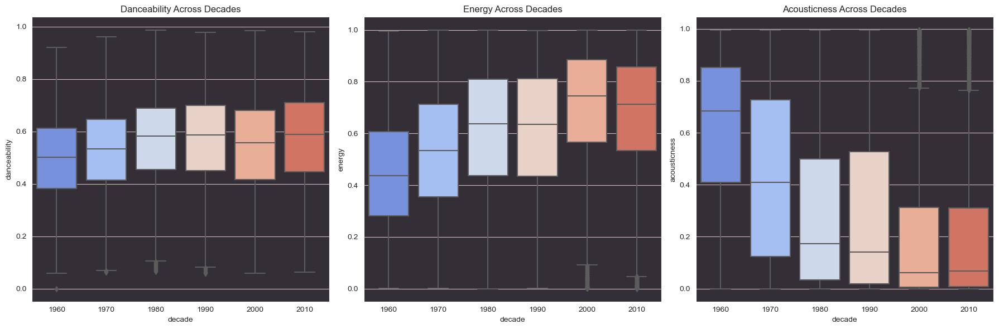

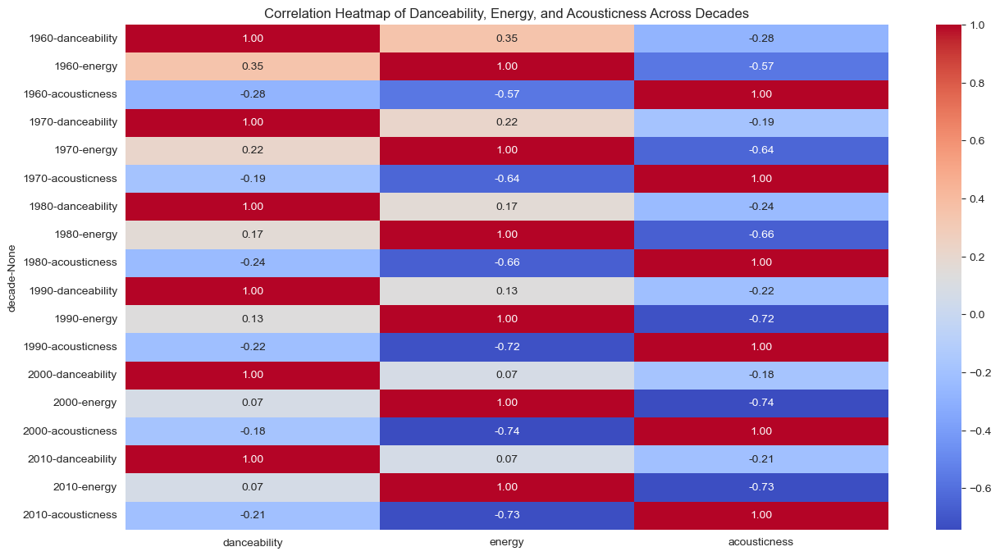

In [73]:
plt.figure(figsize=(18, 6))

# Danceability
plt.subplot(1, 3, 1)
sns.boxplot(x='decade', y='danceability', data=data, palette='coolwarm')
plt.title('Danceability Across Decades')

# Energy
plt.subplot(1, 3, 2)
sns.boxplot(x='decade', y='energy', data=data, palette='coolwarm')
plt.title('Energy Across Decades')

# Acousticness
plt.subplot(1, 3, 3)
sns.boxplot(x='decade', y='acousticness', data=data, palette='coolwarm')
plt.title('Acousticness Across Decades')

plt.tight_layout()
plt.show()

# Creating a correlation heatmap for each decade
correlations = data.groupby('decade')[factors].corr()

# Plotting the correlation heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(correlations, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Danceability, Energy, and Acousticness Across Decades')
plt.show()

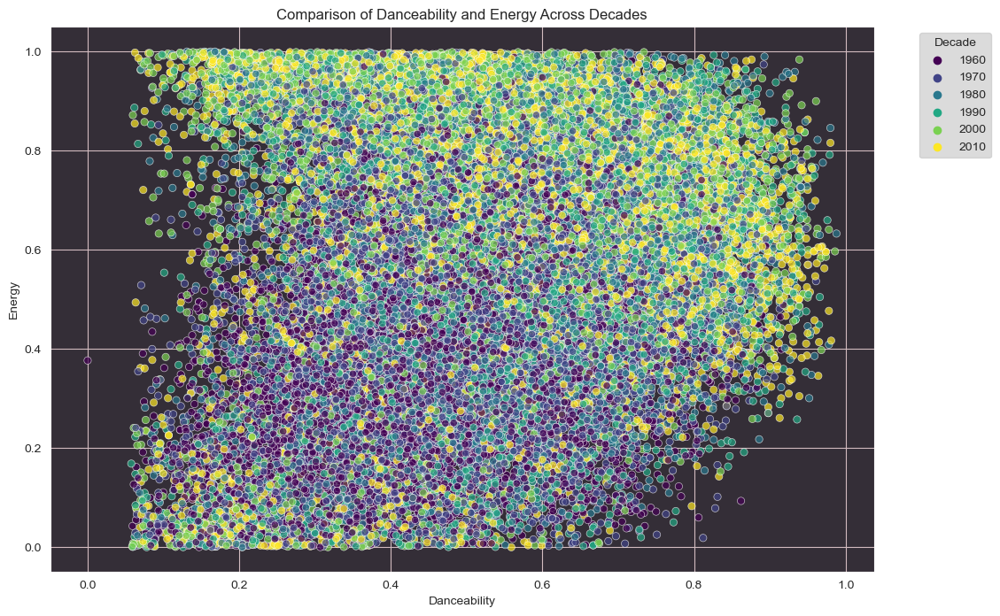

In [74]:
plt.figure(figsize=(12, 8))

# Using a scatter plot to compare 'danceability' and 'energy'
sns.scatterplot(x='danceability', y='energy', hue='decade', data=data, palette='viridis', alpha=0.7)

# Adding titles and labels
plt.title('Comparison of Danceability and Energy Across Decades')
plt.xlabel('Danceability')
plt.ylabel('Energy')

legend = plt.legend(title='Decade', loc='upper right', bbox_to_anchor=(1.15, 1))
frame = legend.get_frame()
frame.set_facecolor('lightgray')


plt.show()

### Visualization 2

A Concentration of songs with moderate to high danceability and energy, possibly indicating popularmusic trends favoring upbeat,
energetic tracks. The denser areas might reflect common musical preferences or production styles, while sparser regions could indicate less common combinations of these attributes in music.

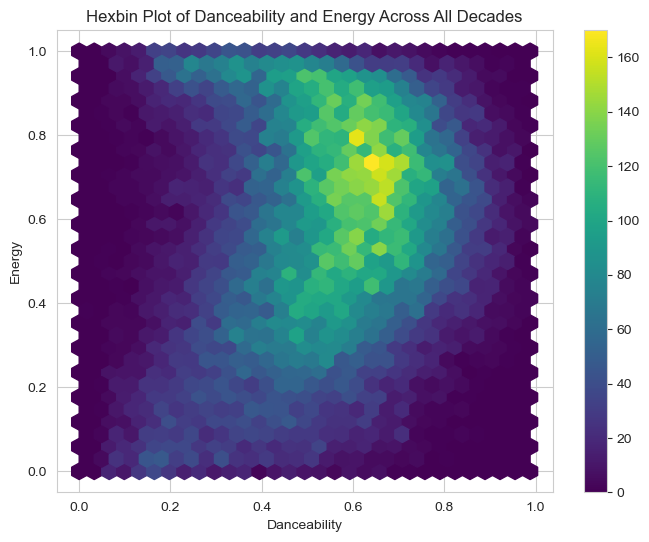

In [75]:
plt.figure(figsize=(8, 6))
# Hexbin plot for 'danceability' and 'energy'
sns.set_style("whitegrid")
hexbin_plot = plt.hexbin(data['danceability'], data['energy'], gridsize=30, cmap='viridis')
plt.colorbar(hexbin_plot) # Adding a color bar
# Adding titles and labels
plt.title('Hexbin Plot of Danceability and Energy Across All Decades')
plt.xlabel('Danceability')
plt.ylabel('Energy')
plt.show()

### Visualization 3

Visualozation include a shift towards more energetic and danceable music in recent decades, a decrease in acousticness reflecting the rise of electronic sounds, and distinct musical characteristics defining each era. These trends might also indicate the influence of technological advancements and genre shifts in music production.

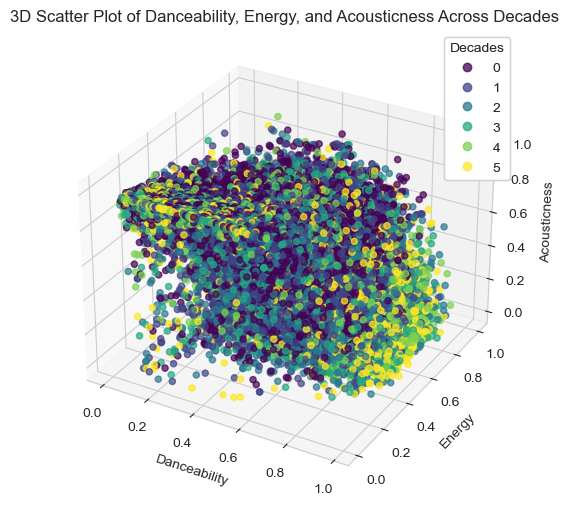

In [76]:
# Creating a 3D scatter plot for a more complex visualization
from mpl_toolkits.mplot3d import Axes3D
factor_3 = 'acousticness' # Selecting another factor to compare - let's choose 'acousticness'

# Setting up the 3D plot
fig = plt.figure(figsize=(6, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(data['danceability'], data['energy'], data[factor_3], c=pd.Categorical(data['decade']).codes,  # Coloring by decade
    cmap='viridis', alpha=0.7)
ax.set_title('3D Scatter Plot of Danceability, Energy, and Acousticness Across Decades')
ax.set_xlabel('Danceability')
ax.set_ylabel('Energy')
ax.set_zlabel('Acousticness')
legend = ax.legend(*scatter.legend_elements(), title="Decades", loc="upper right")
ax.add_artist(legend)
plt.show()

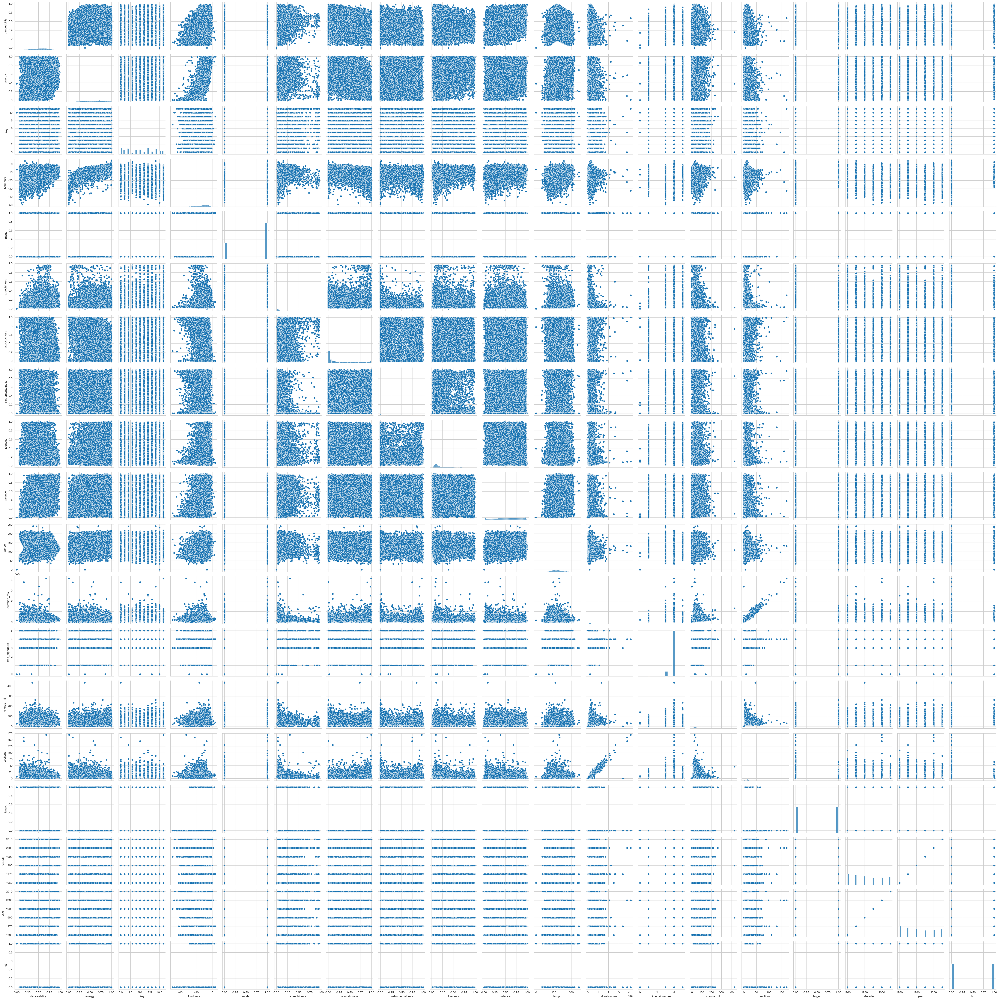

In [77]:
sns.pairplot(data)
plt.show()

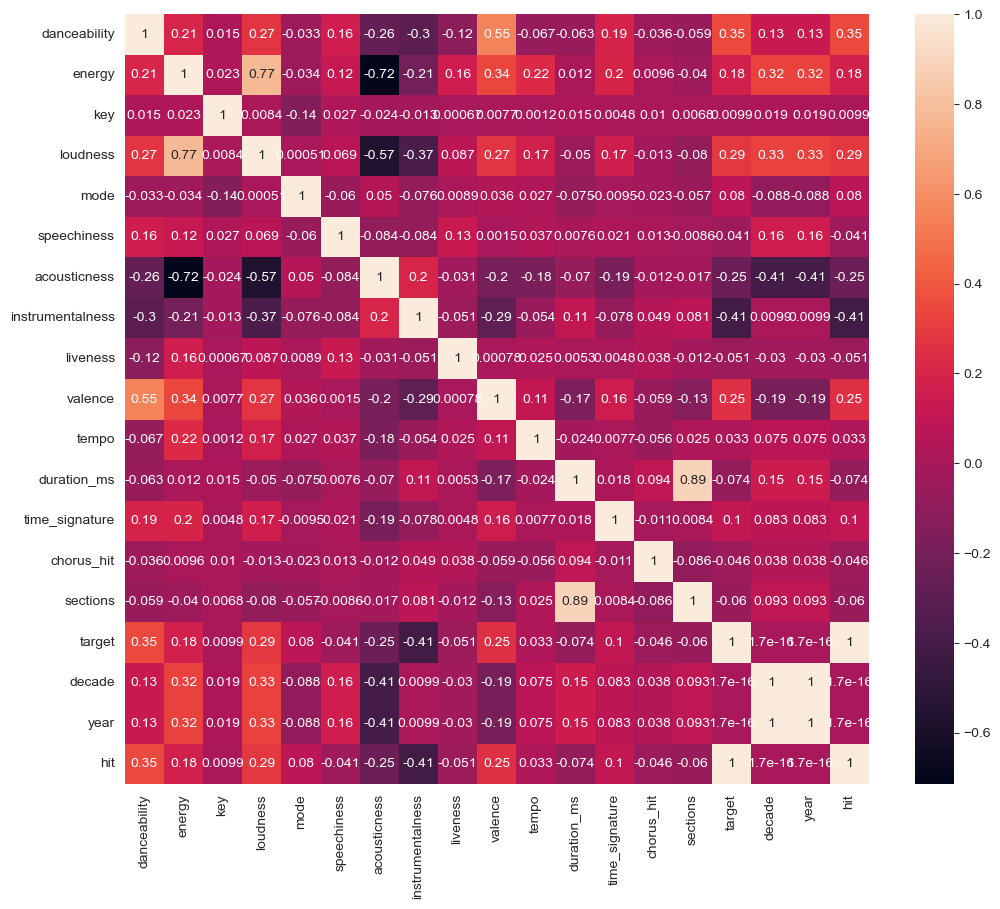

In [78]:
# Plot a heatmap of the correlation matrix for the dataset
plt.figure(figsize=(12, 10))
sns.heatmap(data.corr(), annot=True)
plt.show()

## Machine Learning

In [79]:
X = data.drop(columns=["track", "artist", "uri", "target", "chorus_hit", "sections","decade","year","hit"])
y = data["target"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

X_train = (X_train - X_train.min()) / (X_train.max() - X_train.min())
X_test = (X_test - X_test.min()) / (X_test.max() - X_test.min())

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)


X_train shape: (32884, 13)
X_test shape: (8222, 13)
y_train shape: (32884,)
y_test shape: (8222,)


In [80]:
model = keras.Sequential([
    layers.Reshape((X.shape[1], 1), input_shape=(X.shape[1],)), 
    layers.Conv1D(128, kernel_size=3, activation='relu'),  
    layers.MaxPooling1D(pool_size=2), 
    layers.Conv1D(32, kernel_size=3, activation='relu'),  
    layers.MaxPooling1D(pool_size=2),  
    layers.Flatten(),  
    layers.Dense(32, activation='relu'),  
    layers.Dense(1, activation='sigmoid')  
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

Epoch 1/100
1028/1028 [==============================] - 5s 4ms/step - loss: 0.5450 - accuracy: 0.7214 - val_loss: 0.5111 - val_accuracy: 0.7538
Epoch 2/100
1028/1028 [==============================] - 4s 4ms/step - loss: 0.5157 - accuracy: 0.7412 - val_loss: 0.5055 - val_accuracy: 0.7513
Epoch 3/100
1028/1028 [==============================] - 3s 3ms/step - loss: 0.5071 - accuracy: 0.7449 - val_loss: 0.5532 - val_accuracy: 0.7068
Epoch 4/100
1028/1028 [==============================] - 3s 3ms/step - loss: 0.5024 - accuracy: 0.7506 - val_loss: 0.5174 - val_accuracy: 0.7400
Epoch 5/100
1028/1028 [==============================] - 4s 4ms/step - loss: 0.4984 - accuracy: 0.7531 - val_loss: 0.5317 - val_accuracy: 0.7283
Epoch 6/100
1028/1028 [==============================] - 4s 4ms/step - loss: 0.4974 - accuracy: 0.7541 - val_loss: 0.4930 - val_accuracy: 0.7587
Epoch 7/100
1028/1028 [==============================] - 4s 4ms/step - loss: 0.4943 - accuracy: 0.7549 - val_loss: 0.4938 - val_ac

In [81]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy = {test_accuracy}")

predictions = model.predict(X_test)
threshold = 0.5

predicted_labels = (predictions > threshold).astype(int)

f1 = f1_score(y_test, predicted_labels)
print(f"F1-Score = {f1}")

conf_matrix = confusion_matrix(y_test, predicted_labels)
print("Confusion Matrix = ")
print(conf_matrix)

mse = mean_squared_error(y_test, predictions)
print(f"Mean Squared Error (MSE) = {mse}")

precision = precision_score(y_test, predicted_labels)
print(f"Precision = {precision} ")

257/257 [==============================] - 0s 2ms/step - loss: 0.4930 - accuracy: 0.7587
Test Accuracy = 0.7586961984634399
257/257 [==============================] - 1s 2ms/step
F1-Score = 0.7779270203716141
Confusion Matrix = 
[[2763 1299]
 [ 685 3475]]
Mean Squared Error (MSE) = 0.16344978790815656
Precision = 0.7279011311269376 


In [82]:
print(f"X_test[:1] = {X_test[:1]}")

print("Generate a prediction")
prediction = model.predict(X_test[:1])
print("prediction shape:", prediction)

X_test[:1] =       danceability    energy  key  loudness  mode  speechiness  acousticness  \
9562       0.73428  0.816766  0.0  0.843063   1.0     0.039518      0.006697   

      instrumentalness  liveness   valence     tempo  duration_ms  \
9562          0.000931  0.046504  0.750252  0.637723     0.042157   

      time_signature  
9562             0.8  
Generate a prediction
1/1 [==============================] - 0s 16ms/step
prediction shape: [[0.8809593]]


In [83]:
# Despasito from https://developer.spotify.com/documentation/web-api/reference/get-audio-features

data1 = {"danceability": 0.655,"energy": 0.797, "key": 2,"loudness": 4.787,"mode": 1,"speechiness": 0.153,
  "acousticness": 0.198,"instrumentalness": 0,"liveness": 0.067,"valence": 0.839,"tempo": 177.928,"type": "audio_features",
  "id": "6habFhsOp2NvshLv26DqMb","uri": "spotify:track:6habFhsOp2NvshLv26DqMb","track_href": "https://api.spotify.com/v1/tracks/6habFhsOp2NvshLv26DqMb",
  "analysis_url": "https://api.spotify.com/v1/audio-analysis/6habFhsOp2NvshLv26DqMb","duration_ms": 229360, "time_signature": 4 }

df = pd.DataFrame(data1, index=[0])
print(df)
X = data[:1]
print(f"X = {X} \n")
X = X.drop(columns=["track", "artist", "uri", "target"])
print(f"X = {X} \n")

despasito = df.drop(columns=["type", "id", "uri", "track_href", "analysis_url"])
print(f"despasito = {despasito}")

print("Generate a prediction")
prediction = model.predict(despasito)
print("prediction:", prediction)

if prediction > 0.5:
    print("It's a hit !")
else:
    print("Not Quite There Yet!")

   danceability  energy  key  loudness  mode  speechiness  acousticness  \
0         0.655   0.797    2     4.787     1        0.153         0.198   

   instrumentalness  liveness  valence    tempo            type  \
0                 0     0.067    0.839  177.928  audio_features   

                       id                                   uri  \
0  6habFhsOp2NvshLv26DqMb  spotify:track:6habFhsOp2NvshLv26DqMb   

                                          track_href  \
0  https://api.spotify.com/v1/tracks/6habFhsOp2Nv...   

                                        analysis_url  duration_ms  \
0  https://api.spotify.com/v1/audio-analysis/6hab...       229360   

   time_signature  
0               4  
X =                                     track         artist  \
0  Attaining - Take 1 / Alternate Version  John Coltrane   

                                    uri  danceability  energy  key  loudness  \
0  spotify:track:3EwLV5hZqLKx5e0Lp1QcB7         0.342   0.462    4   -12.931   

 

In [89]:
gb_model = GradientBoostingClassifier(n_estimators=100, random_state=1)
gb_model.fit(X_train, y_train)

test_accuracy_gb = gb_model.score(X_test, y_test)
print(f"Test Accuracy (Gradient Boosting): {test_accuracy_gb}")

predictions_gb = gb_model.predict(X_test)

f1_gb = f1_score(y_test, predictions_gb)
precision_gb = precision_score(y_test, predictions_gb)
conf_matrix_gb = confusion_matrix(y_test, predictions_gb)

print(f"F1-Score (Gradient Boosting): {f1_gb}")
print(f"Precision (Gradient Boosting): {precision_gb}")
print("Confusion Matrix (Gradient Boosting): ")
print(conf_matrix_gb)

prediction_gb = gb_model.predict(despasito)
print("Gradient Boosting Prediction:", prediction_gb)

if prediction_gb > 0.5:
    print("It's a hit (Gradient Boosting)!")
else:
    print("Not Quite There Yet (Gradient Boosting)!")


Test Accuracy (Gradient Boosting): 0.760885429335928
F1-Score (Gradient Boosting): 0.7631325301204819
Precision (Gradient Boosting): 0.764975845410628
Confusion Matrix (Gradient Boosting): 
[[3089  973]
 [ 993 3167]]
Gradient Boosting Prediction: [1]
It's a hit (Gradient Boosting)!


Additionally we have trained multiple other ML models and have printed the accuracy we get by using them.

In [84]:
models = {
    "                   Logistic Regression": LogisticRegression(),
    "                         Decision Tree": DecisionTreeClassifier(),
    "Support Vector Machine (Linear Kernel)": LinearSVC(),
    "   Support Vector Machine (RBF Kernel)": SVC(),
    "                        Neural Network": MLPClassifier(),
    "                         Random Forest": RandomForestClassifier(),
    "                     Gradient Boosting": GradientBoostingClassifier()
}

for name, model in models.items():
    model.fit(X_train, y_train)
    print(name + " trained.")

                   Logistic Regression trained.
                         Decision Tree trained.
Support Vector Machine (Linear Kernel) trained.
   Support Vector Machine (RBF Kernel) trained.
                        Neural Network trained.
                         Random Forest trained.
                     Gradient Boosting trained.


In [85]:
for name, model in models.items():
    print(name + ": {:.2f}%".format(model.score(X_test, y_test) * 100))

                   Logistic Regression: 72.88%
                         Decision Tree: 67.65%
Support Vector Machine (Linear Kernel): 73.02%
   Support Vector Machine (RBF Kernel): 76.22%
                        Neural Network: 77.24%
                         Random Forest: 76.22%
                     Gradient Boosting: 76.09%


In [86]:
clf=RandomForestClassifier()
clf.fit(X_train,y_train) #Train the model using the training sets y_pred=clf.predict(X_test)
y_pred=clf.predict(X_test)
y_pred

array([1, 0, 1, ..., 0, 0, 0], dtype=int64)

In [87]:
from IPython.core.display import HTML

# Assuming 'model' is your pre-loaded prediction model
def generate_html(prediction):
    # Define colors for hit or not
    hit_color = "#28a745"  # Green for hit
    not_hit_color = "#dc3545"  # Red for not a hit

    # Determine the message and color based on the prediction
    if prediction > 0.5:
        message = "It's a hit!"
        color = hit_color
    else:
        message = "Not Quite There Yet!"
        color = not_hit_color

    # HTML structure with dynamic content
    html_content = f"""
    <html>
    <head>
        <title>Song Prediction Result</title>
        <style>
            .result-container {{
                background-color: {color};
                color: white;
                padding: 20px;
                text-align: center;
                border-radius: 10px;
                font-family: Arial, sans-serif;
            }}
        </style>
    </head>
    <body>
        <div class="result-container">
            <h4>🌟 Analyzing the Hit Potential of 'Despacito' 🌟</h4>
            <h2 class = "center-text">The Song is a HIT</h2>
        </div>
    </body>
    </html>
    """

    return html_content

In [88]:
prediction = model.predict(despasito) # Generate a prediction

# Generate HTML output
html_output = generate_html(prediction)
display(HTML(html_output))